# cNMF investigation
When cNMF run is completed you should use this NB to analyze the outcome programs.

In [1]:
lib = r'/srv01/technion/shitay/Code/classifying_response_to_immunotherapy/'
import sys
sys.path.append(lib)
from utilities.package_importing import *

Loads cohort and extract tumor cells:

In [2]:
# tumor_path = r'/storage/md_keren/shitay/Data/droplet_seq/cohort/normalized/5.21/cohort_normalized_24.5.21.pkl'
# COHORT_PATH = r'/storage/md_keren/shitay/Data/droplet_seq/cohort/normalized/6.21/cohort_normalized_26.6.21.pkl'
COHORT_PATH = r'/storage/md_keren/shitay/Data/droplet_seq/M97_M173/subcohort/normalized/1.1.22/subcohort_normalized_1.1.22_protein_coding_genes.pkl'

# tumor_cohort = pickle.load(open(tumor_path, 'rb'))
cohort = pickle.load(open(COHORT_PATH, 'rb'))
tumor_cohort = cohort.filter_cells_by_property('is_cancer', True)



In [3]:
print(tumor_cohort.number_of_genes)
print(tumor_cohort.number_of_cells)

20273
51401


Loads tSNE:

In [4]:
TSNE_PATH = r'/storage/md_keren/shitay/outputs/TSNE/subcohort_1.1.22/tumor/tumor_bhtsne_1.1.22.pkl'
cells_embedded = pickle.load(open(TSNE_PATH, 'rb'))


# tsne_results = pd.DataFrame(cells_embedded, index=tumor_cohort.barcodes, columns=['TSNE1', 'TSNE2'])
index = [tumor_cohort.samples[i]+"_"+tumor_cohort.barcodes[i] for i in range(tumor_cohort.number_of_cells)]
tsne_results = pd.DataFrame(cells_embedded, index=index, columns=['TSNE1', 'TSNE2']) 

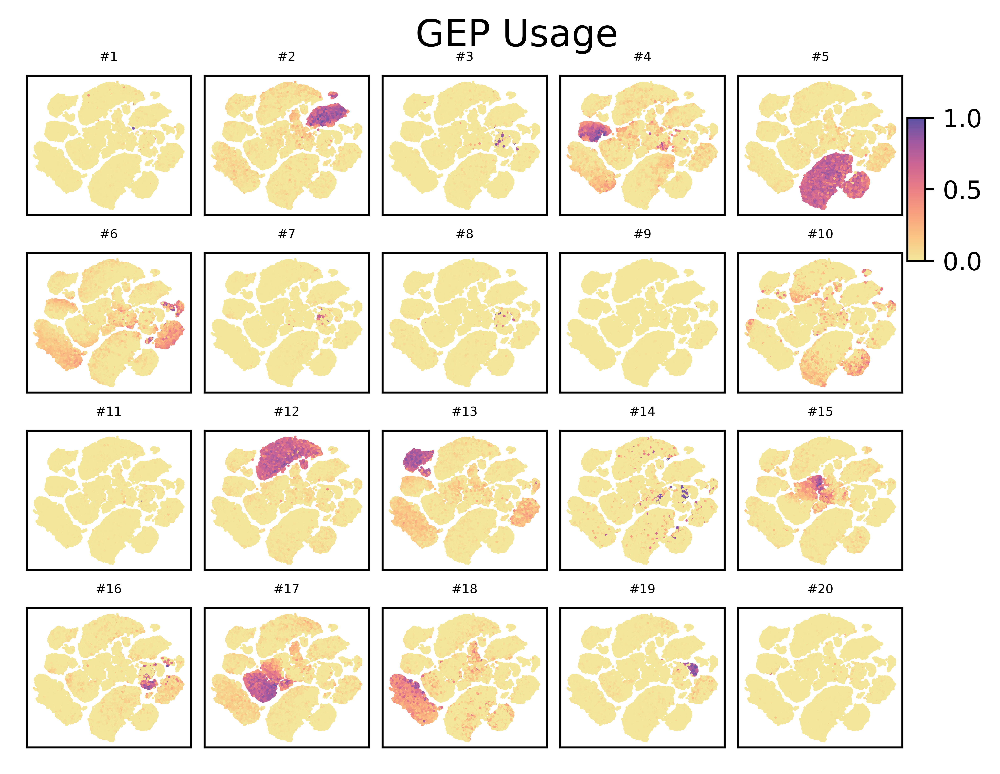

In [5]:
EXEC_DIR = r'/storage/md_keren/shitay/outputs/cNMF/executions/tumor_runs/subcohort_1.1.22'
selected_K = 20
local_density_threshold = '0.10'
number_of_genes=2000
n_replicates = 200
RUN_RANGE = '20'

RUN_NAME = f'k{RUN_RANGE}_{number_of_genes}genes_{n_replicates}iter'
USAGES_CONSENSUS_FILE = f'{RUN_NAME}.usages.k_{selected_K}.dt_{str(local_density_threshold).replace(".", "_")}.consensus.txt'


usage_matrix = pd.read_csv(join(EXEC_DIR, RUN_NAME, USAGES_CONSENSUS_FILE), sep='\t', index_col=0)
usage_matrix.columns = np.arange(1,selected_K+1)
normalized_usage_matrix = usage_matrix.div(usage_matrix.sum(axis=1), axis=0)
normalized_usage_matrix.head()


cmap = pickle.load(open(r'/storage/md_keren/shitay/garbage/cmap.pkl', 'rb'))
tsne_and_usages = pd.merge(left=normalized_usage_matrix, right=tsne_results, left_index=True, right_index=True)



(fig,axes) = plt.subplots(int(np.ceil(selected_K/5)), 5, figsize=(5,4), dpi=1000)
axes = axes.ravel()
for i in range(1,selected_K+1):
    sc = axes[i-1].scatter(tsne_and_usages['TSNE1'], tsne_and_usages['TSNE2'], c=tsne_and_usages[i],
                      cmap=cmap, vmin=0, vmax=1.,
                      s=1, edgecolor='none', rasterized=True)
    axes[i-1].set_title('#'+str(i), fontsize= 5)
    axes[i-1].set_xticks([])
    axes[i-1].set_yticks([])
    
    
    

plt.tight_layout(pad=0.2)
cbarax = fig.add_axes([1,.7,.02, .2])
plt.colorbar(sc, cax=cbarax)
_ = plt.figtext(.45,1,'GEP Usage', fontsize=15)
if selected_K%5>0:
    for i in range(5-selected_K%5, 0, -1):
        axes[-i].remove()

In [8]:
FIG_FOLDER = fr'/storage/md_keren/shitay/outputs/cNMF/visualizations/subcohort_1.1.22/k{selected_K}'
FIG_NAME = r'tSNE_GEP.png'
from utilities.general_helpers import create_folder
create_folder(FIG_FOLDER)
fig.savefig(join(FIG_FOLDER, FIG_NAME))

We might also want to investigate which genes are driving which programs. We can do so by loading the Z-score transformed spectra and sorting it as follows

In [9]:
GENE_SPECTRA_SCORE_PATH = f'{RUN_NAME}.gene_spectra_score.k_{selected_K}.dt_{str(local_density_threshold).replace(".", "_")}.txt'
gene_scores = pd.read_csv(join(EXEC_DIR, RUN_NAME, GENE_SPECTRA_SCORE_PATH), sep='\t', index_col=0)
gene_scores = gene_scores.T
gene_scores.head()

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
TSPAN6,-0.000113,-0.000063,0.000084,-0.000796,0.000638,-0.000462,-0.000062,-0.000274,-0.000015,-0.000065,-0.000110,-0.000906,0.000782,-0.000194,-0.000029,0.000898,0.000192,0.000059,0.000699,0.000010
TNMD,-0.000017,-0.000103,-0.000046,-0.000049,-0.000129,-0.000078,-0.000339,-0.000233,0.000008,0.000027,-0.000111,-0.000125,-0.000093,-0.000023,-0.000030,-0.000099,-0.000142,-0.000099,0.003770,-0.000134
DPM1,0.000146,0.000124,-0.000023,-0.000433,-0.000271,-0.000250,-0.000029,0.000075,-0.000045,0.000539,-0.000064,0.001803,-0.000223,0.000062,0.000263,-0.000130,-0.000745,-0.000634,0.000016,-0.000011
SCYL3,-0.000028,0.000142,-0.000014,-0.000157,-0.000090,-0.000156,-0.000046,0.000152,0.000019,-0.000041,-0.000018,-0.000475,0.000252,-0.000076,-0.000024,0.000243,0.000153,0.000671,0.000106,-0.000047
C1orf112,0.000160,-0.000195,-0.000016,-0.000259,0.000130,-0.000191,-0.000049,-0.000107,-0.000008,0.001587,-0.000038,-0.000224,-0.000175,-0.000020,0.000053,0.000048,-0.000259,0.000079,-0.000179,0.000776


# Below we plot the top 10 genes associated with each gene expression program


In [10]:
topgenes = []
num_top_genes=100
for gep in gene_scores.columns:
    topgenes.append(pd.Series(gene_scores[gep].sort_values(ascending=False).index[:num_top_genes]))
    
topgenes = pd.concat(topgenes, axis=1)
topgenes.columns = ['GEP%d' % g for g in gene_scores.columns]

topgenes.head(10)

,GEP1,GEP2,GEP3,GEP4,GEP5,GEP6,GEP7,GEP8,GEP9,GEP10,GEP11,GEP12,GEP13,GEP14,GEP15,GEP16,GEP17,GEP18,GEP19,GEP20
0,FGFR2,NSG1,PLVAP,S100A6,YIF1A,ARHGAP15,COL1A1,ACTA2,UGT3A1,CENPF,KLK11,CTAG2,NPC2,TYROBP,ATOX1,NDST3,FXYD3,HLA-B,DCN,CSF2
1,APLP1,MPZ,CLEC14A,SPHK1,POLR1D,RPS3,COL1A2,TAGLN,C10orf71,TOP2A,MUC16,PSMA7,TMED10,AIF1,CTSL,FAM19A1,CHCHD6,HLA-E,RARRES2,MMP1
2,ST18,TYR,VWF,HMGA1,CDK4,RPS18,COL3A1,MYL9,LRRC38,CDKN3,SLPI,PHLDA2,PCSK1N,LAPTM5,LGALS3,PCDH17,PLEKHB1,B2M,CXCL12,CXCL5
3,KLK6,MBP,ELTD1,KIAA1199,CCND1,RPS2,MXRA5,ADIRF,TSPY8,H2AFZ,PRG4,DBI,H2AFJ,HCST,EPHX1,SOX11,IQGAP2,TAP1,C7,CSF3
4,ELAVL3,S100B,CD93,IL24,CDKN2A,RPS25,LRRC15,TPM2,MYOG,TPX2,PDZK1IP1,PDLIM4,C14orf2,LYZ,GRAMD1B,RBP1,ATP1B1,HLA-C,PROK1,MMP3
5,MOG,SLC31A2,CDH5,FN1,NACA,RPS12,COMP,MYH11,TNNI1,UBE2C,CALB2,PPDPF,NDUFB1,LSP1,CHCHD10,ABCA8,TEKT5,HLA-A,SERPING1,LIMS3L
6,ERMN,CDH1,ECSCR,FIBCD1,GTF3A,RPS5,WNT2,CNN1,CHRNG,ASPM,LRRN4,SH3BGRL3,NUP210L,C1QB,CAPG,SLITRK6,CAPN3,JAM3,C1S,KRTAP4-2
7,GPD1,QPCT,RAMP3,IL33,GJB6,RPS6,CXCL14,TPM1,MYL1,BIRC5,EGFL6,CD151,ESRP1,HLA-DRA,GAGE2A,BCHE,RPS4Y1,CD74,ADH1B,PSG6
8,CNTN2,FXYD6,SLCO2A1,S100A13,CDKAL1,RPL37A,DPT,BCAM,TMEM8C,HMGB2,AP1M2,SEC61G,SPON2,C1QA,RPL27,ITGA8,FCGR2A,WARS,OGN,KRTAP4-9
9,DBNDD2,TMEM50A,ENG,ADAM8,NDUFV1,RPS16,COL6A3,PLAC9,TNNT3,HMGN2,UPK3B,PPIB,HIST1H2BC,HLA-DPA1,PMEL,MLLT11,F2RL2,PSAP,SMOC2,SCN10A


In [11]:
topgenes.to_excel(fr'/storage/md_keren/shitay/outputs/cNMF/visualizations/subcohort_1.1.22/k{selected_K}/GEP_top_100_genes.xlsx')

In [12]:
tsne_and_usages.head()

,1,2,3,4,5,6,7,8,9,10,...,13,14,15,16,17,18,19,20,TSNE1,TSNE2
M106_AAACCTGAGATCCCAT-1,0.000000,0.037515,0.000000,0.065667,0.023132,0.089895,0.050070,0.001854,0.000482,0.056826,...,0.000000,0.000000,0.505320,0.027660,0.141579,0.000000,0.000000,0.00000,0.790565,1.554911
M106_AAACCTGCACTAAGTC-1,0.009477,0.107657,0.073435,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.020131,0.001870,0.109511,0.000000,0.608337,0.000000,0.069581,0.00000,-2.865331,-1.462621
M106_AAACCTGGTTGTCTTT-1,0.004528,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.980855,0.014618,0.000000,0.000000,0.000000,0.00000,5.578968,0.811670
M106_AAACCTGTCATGCATG-1,0.000000,0.024897,0.000000,0.026137,0.000000,0.027071,0.000000,0.000000,0.034389,0.000000,...,0.077365,0.000000,0.305714,0.000000,0.456966,0.000000,0.000000,0.00000,-6.678986,5.088406
M106_AAACCTGTCGTATCAG-1,0.000000,0.000000,0.000000,0.210960,0.000000,0.000000,0.004264,0.000000,0.000000,0.000000,...,0.000000,0.021557,0.152869,0.000000,0.218759,0.130728,0.000000,0.04636,-11.262187,8.389959


In [13]:
normalized_usage_matrix.to_excel(fr'/storage/md_keren/shitay/outputs/cNMF/visualizations/subcohort_1.1.22/k{selected_K}/normalized_usage_matrix.xlsx')

# Visualization

In [14]:
normalized_usage_matrix.head()
normalized_usage_matrix.iloc[['1']]
# normalized_usage_matrix
samples = list(set([uu.split('_')[0] for uu in list(normalized_usage_matrix.index)]))


total sum expression of samples in program

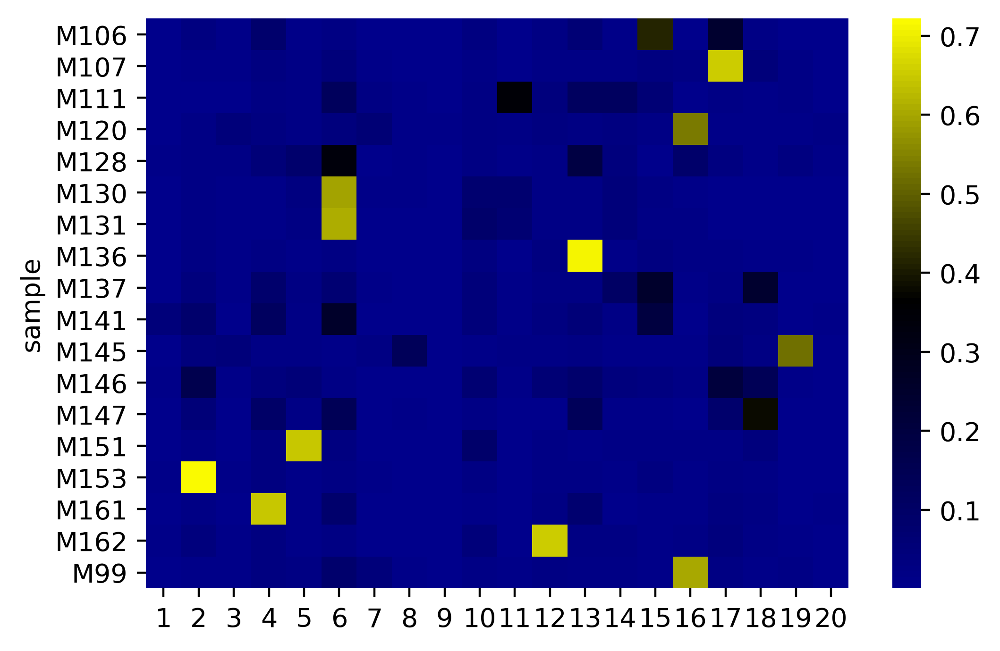

In [15]:
import seaborn as sb
df = normalized_usage_matrix.copy()
df['sample'] = [uu.split('_')[0] for uu in list(df.index)]
df['barcode'] = [uu.split('_')[1] for uu in list(df.index)]
df = df.set_index(['sample', 'barcode'])
samples_programs_prop = df.groupby(['sample']).sum() / df.groupby(['sample']).count()
cmap = pickle.load(open(r'/storage/md_keren/shitay/outputs/clustering/immune/heatmap/colorbar.pkl', 'rb'))
sb.heatmap(samples_programs_prop, cmap=cmap);

Specify a a threshold of min expression for cell in a program, and see the percentage of cells expresing each program for all samples

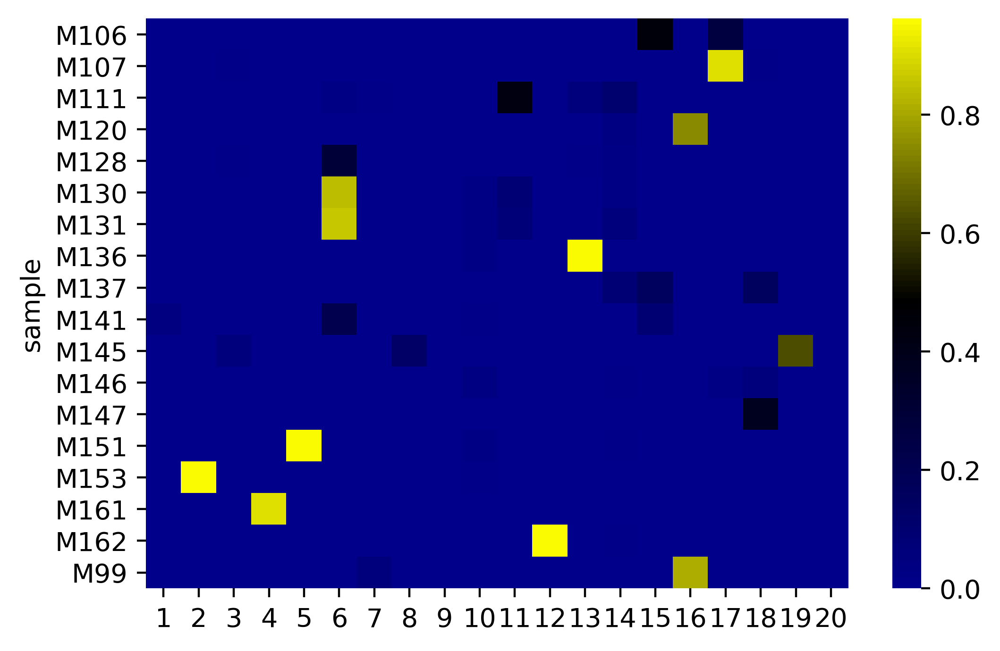

In [16]:
min_expression_to_be_counted = 0.4

df2 = df > min_expression_to_be_counted
portion_expressing_programs = df2.groupby(['sample']).sum() / df2.groupby(['sample']).count()
sb.heatmap(portion_expressing_programs, cmap=cmap);

See all thresholds of min expression for being counted

In [17]:
# fig, axs = plt.subplots(ncols=3, gridspec_kw=dict(width_ratios=[4,1,0.2]))
# fig, axs = plt.subplots(ncols=3)
fig, axs = plt.subplots(3, 3)
fig.set_size_inches(32, 22)
# sb.heatmap(portion_expressing_programs, cmap=cmap, ax=axs[0,0]);
# sb.heatmap(portion_expressing_programs, cmap=cmap, ax=axs[1,0]);
import itertools
index = [(x,y) for x in np.arange(3) for y in np.arange(3)]


for i in range(9):
    min_expression_to_be_counted = round(0.1 * (i+1),2)
    df2 = df > min_expression_to_be_counted
    portion_expressing_programs = df2.groupby(['sample']).sum() / df2.groupby(['sample']).count()
    axs[index[i][0], index[i][1]].set_title(f"Threshold - {min_expression_to_be_counted}")
    sb.heatmap(portion_expressing_programs, cmap=cmap, ax=axs[index[i][0], index[i][1]]);

In [18]:
fig.savefig(fr'/storage/md_keren/shitay/outputs/cNMF/visualizations/subcohort_1.1.22/k{selected_K}/different_expression_thresholds.jpg')

# DIsplaying programs information
* see how many cells are assocatied with each program
* see which samples


In [20]:
def show_values_on_bars(axs):
    def _show_on_single_plot(ax):        
        for p in ax.patches:
            _x = p.get_x() + p.get_width() / 2
            _y = p.get_y() + p.get_height()
            value = '{:.2f}%'.format(p.get_height())
            ax.text(_x, _y, value, ha="center") 

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _show_on_single_plot(ax)
    else:
        _show_on_single_plot(axs)


In [21]:
selected_K = 20
fig, axs = plt.subplots(int(np.ceil(selected_K/5)), 5)
axs = axs.ravel()

fig.set_size_inches(32, 22)
for idx, (columnName, columnData) in enumerate(normalized_usage_matrix.iteritems()):
#     print('Program : ', columnName)
    programs_vals = columnData.values
    df = pd.DataFrame(np.round(programs_vals, 1),columns=['Usage'])
    g = sns.barplot(x="Usage", y="Usage", data=df, estimator=lambda x: len(x) / len(df) * 100, ax=axs[idx]);
    g.set(ylabel="% of the cells");
    g.set_title(f'Program {columnName}')
    show_values_on_bars(g)
fig.tight_layout()
if selected_K%5>0:
    for i in range(5-selected_K%5, 0, -1):
        axs[-i].remove()

In [22]:
fig.savefig(fr'/storage/md_keren/shitay/outputs/cNMF/visualizations/subcohort_1.1.22/k{selected_K}/cell_usages.jpg')


see how many cells are assocatied with each program.

each usage value you see the number of cells with that usage or more (the usage value are rounded).

the programs are sorted by the value of number of cells with 0.1 usage or more.

In [23]:
programs_dfs = {}

for column in normalized_usage_matrix.columns:

    programs_vals = np.round(normalized_usage_matrix[column].values, 1)
    curr_program_usage = pd.DataFrame([x/10 for x in range(11)], columns=['Usage'])
    curr_program_usage['val'] = curr_program_usage['Usage'].apply(lambda x: (sum(programs_vals>=x)/len(programs_vals))*100)
    programs_dfs[column] = curr_program_usage
programs_dfs = {k: v for k, v in sorted(programs_dfs.items(), key=lambda item: item[1].iloc[1].val, reverse=True)}

fig, axs = plt.subplots(int(np.ceil(selected_K/5)), 5)
axs = axs.ravel()

fig.set_size_inches(32, 22)
for idx, (columnName, program_df) in enumerate(programs_dfs.items()):
    g = sns.barplot(x="Usage", y="val", data=program_df, ax=axs[idx])#, estimator=lambda x: len(x) / len(df) * 100, ax=axs[idx]);    
    g.set(ylabel="% of the cells");
    g.set_title(f'Program {columnName}')
    show_values_on_bars(g)
fig.tight_layout()
if selected_K%5>0:
    for i in range(5-selected_K%5, 0, -1):
        axs[-i].remove()

In [24]:
fig.savefig(fr'/storage/md_keren/shitay/outputs/cNMF/visualizations/subcohort_1.1.22/k{selected_K}/accu_cell_usages_sorted.jpg')

# Anaylize cells in program

**specify program num and threshold and see how many cells express this program > threshold in each sample**

In [18]:
program_num = 5
threshold = 0.8

# taks normalized_usage_matrix and change id of df
usage_matrix = normalized_usage_matrix.copy()
usage_matrix['sample'] = [uu.split('_')[0] for uu in list(usage_matrix.index)]
usage_matrix['barcode'] = [uu.split('_')[1] for uu in list(usage_matrix.index)]
usage_matrix = usage_matrix.set_index(['sample', 'barcode']).reset_index()

total_n_cells = sum(usage_matrix[program_num]>threshold)/ len(usage_matrix)
n_cells_in_each_sample = usage_matrix[usage_matrix[program_num]>threshold].groupby(['sample']).count().reset_index()[['sample','barcode']].values.tolist()
print(n_cells_in_each_sample)

[['M100', 159], ['M105', 38], ['M106', 64], ['M107', 1138], ['M108', 101], ['M109', 2], ['M112', 69], ['M115', 5], ['M118', 4], ['M124', 1], ['M127', 2], ['M128', 2], ['M129', 16], ['M132', 305], ['M133', 471], ['M135', 3], ['M136', 2], ['M137', 5], ['M141', 2], ['M144', 23], ['M145', 7], ['M146', 7], ['M98', 9], ['M99', 1]]


 **Extract cells with high usage and cells with low usage of a given program**
 
 cells with high usage - usage above top_usage_thr, cells with low usage - usage below lower_usage_thr
 
 Part1: See what part of the of top genes (of a given program) reads make up of the total amount of reads (cells with high usage VS. cells with low usage)
 
Part2: Present boxplots of top genes expression of a given program

- previous version was for a specific sample now it works for all samples. you can turn it on by removing the comment of three lines that are marked

In [19]:
GEP = 5
top_usage_thr = 0.8
lower_usage_thr = 0.2


# previous version - return this line (and the next three marked lines) if you want it to be only for that sample
# sample_id = 'M133' 

# extract sample
sample_cells = tumor_cohort
# sample_cells = tumor_cohort[np.array(tumor_cohort.samples)==sample_id] # (line 1.) previous version - return this line if you want it to be only for that sample


# taks all cells express GEP above up_threshold
high_expressed_df = usage_matrix[usage_matrix[GEP]>top_usage_thr]
sample_cells_in_program_df = high_expressed_df # compare all samples

# taks all cells belong to sample_id # previous version - return this line if you want it to be only for that sample
# sample_cells_in_program_df = high_expressed_df[high_expressed_df['sample']==sample_id] # (line 2.) previous version - return this line if you want it to be only for that sample

# extract droplet python object of those cells belong to sample one object of cells above threshold and the second below
sample_cells_highly_express_program = tumor_cohort.get_subset_by_identifiers(sample_cells_in_program_df['sample'], sample_cells_in_program_df['barcode'])
# sample_cells_out_program = tumor_cohort[[idx for idx, bb in enumerate(sample_cells.barcodes) if not bb in list(sample_cells_in_program_df['barcode'])]]



# taks all cells express GEP below down_threshold
low_expressed_df = usage_matrix[usage_matrix[GEP]<=lower_usage_thr]
sample_cells_not_in_program_df = low_expressed_df # compare all samples
# taks all cells belong to sample_id # previous version - return this line if you want it to be only for that sample
# sample_cells_not_in_program_df = low_expressed_df[low_expressed_df['sample']==sample_id] # (line 3.) previous version - return this line if you want it to be only for that sample

# extract droplet python object of those cells belong to sample one object of cells above threshold and the second below
sample_cells_out_program = tumor_cohort.get_subset_by_identifiers(sample_cells_not_in_program_df['sample'], sample_cells_not_in_program_df['barcode'])



# print(f'number of cells in sample {sample_id}: {sample_cells.number_of_cells}')
# print(f'number of cells in sample {sample_id} use GEP {GEP} above {top_usage_thr}: {sample_cells_highly_express_program.number_of_cells}')
# print(f'number of cells in sample {sample_id} use GEP {GEP} below {lower_usage_thr}: {sample_cells_out_program.number_of_cells}')

print(f'number of cells (all samples): {sample_cells.number_of_cells}')
print(f'number of cells (all samples) use GEP {GEP} above {top_usage_thr}: {sample_cells_highly_express_program.number_of_cells}')
print(f'number of cells (all samples) use GEP {GEP} below {lower_usage_thr}: {sample_cells_out_program.number_of_cells}')

number of cells (all samples): 104935
number of cells (all samples) use GEP 5 above 0.8: 2436
number of cells (all samples) use GEP 5 below 0.2: 53290


**Part1: see what part of the of top genes (of a given program) reads make up of the total amount of reads (cells with high usage VS. cells with low usage):**


In [20]:
# sort genes by scores
top_genes_in_program = pd.Series(gene_scores[GEP].sort_values(ascending=False).index).tolist()
top_genes_indices = [tumor_cohort.gene_names.index(gene) for gene in top_genes_in_program if gene in tumor_cohort.gene_names]


<Figure size 6400x4000 with 0 Axes>

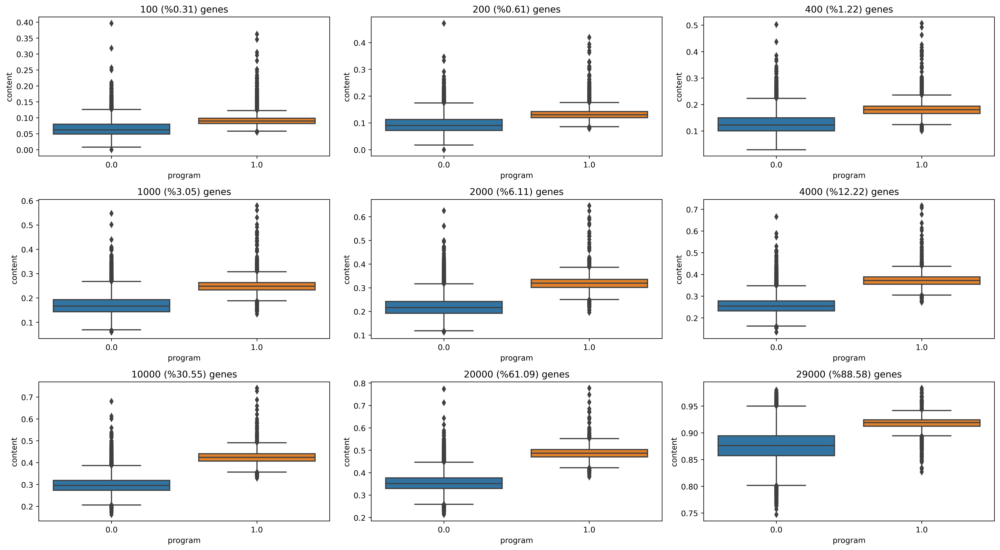

In [21]:
content_considered_list = [100, 200, 400, 1000, 2000, 4000, 10000, 20000, 29000]

plt.figure(figsize=(16,10));
# plt.figure(figsize=(16,56))
fig, axes = plt.subplots(int(np.ceil(len(content_considered_list)/3)), 3, figsize=(18, 10));
axes = axes.ravel();
axes_indices = [(x,y) for x in range(int(np.ceil(len(content_considered_list)/3))) for y in range(3)]

for idx, content_considered in enumerate(content_considered_list):
    
    if len(axes.shape)>1:
        ax = axes[axes_indices[idx][0], axes_indices[idx][1]]
    else:
        ax = axes[idx]
    

    highly_used_content = np.divide(np.sum(sample_cells_highly_express_program.counts[:, top_genes_indices[:content_considered]], axis=1), np.sum(sample_cells_highly_express_program.counts, axis=1))
    low_used_content = np.divide(np.sum(sample_cells_out_program.counts[:, top_genes_indices[:content_considered]], axis=1), np.sum(sample_cells_out_program.counts, axis=1))

    content_df = pd.DataFrame(transpose([highly_used_content, [1]*sample_cells_highly_express_program.number_of_cells]), columns=['content', 'program'])
    content_df = content_df.append(pd.DataFrame(transpose([low_used_content, [0]*sample_cells_out_program.number_of_cells]), columns=['content', 'program']))
    g = sns.boxplot(ax=ax, x="program", y="content", data=content_df)
    ax.set_title(f'{content_considered} (%{round((content_considered/tumor_cohort.number_of_genes)*100, 2)}) genes');
    
fig.tight_layout();

if len(content_considered_list)%3>0:
    for i in range(3-len(content_considered_list)%3, 0, -1):
        axes[-i].remove();


**Part2: boxplots displaying top genes expression of a given program**

<Figure size 6400x4000 with 0 Axes>

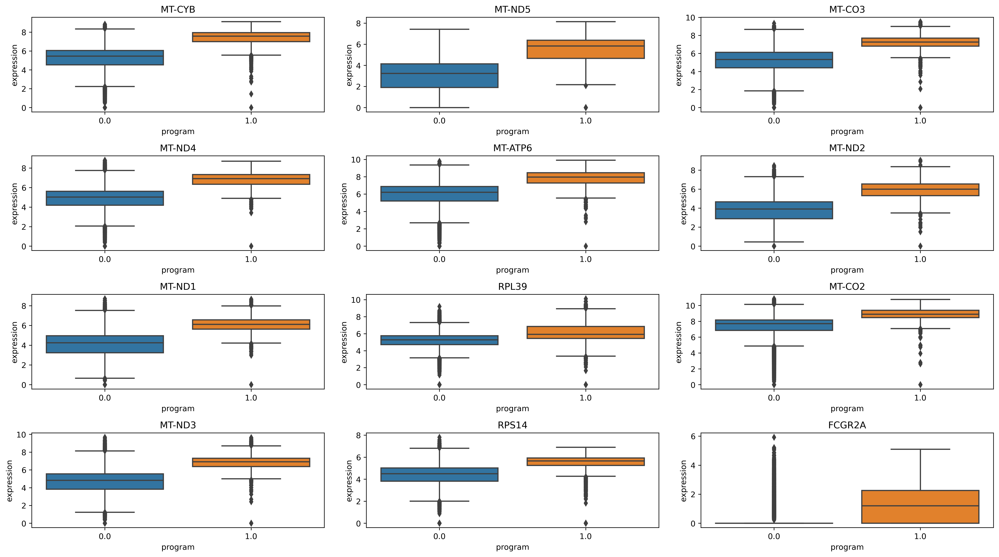

In [22]:
num_top_genes=12

top_genes_in_program = pd.Series(gene_scores[GEP].sort_values(ascending=False).index[:num_top_genes]).tolist()
plt.figure(figsize=(16,10));
# plt.figure(figsize=(16,56))
fig, axes = plt.subplots(int(np.ceil(len(top_genes_in_program)/3)), 3, figsize=(18, 10));
axes = axes.ravel();
axes_indices = [(x,y) for x in range(int(np.ceil(len(top_genes_in_program)/3))) for y in range(3)]

for idx, marker_name in enumerate(top_genes_in_program):
    
    if len(axes.shape)>1:
        ax = axes[axes_indices[idx][0], axes_indices[idx][1]]
    else:
        ax = axes[idx]
    
    
    gene_index = tumor_cohort.gene_names.index(marker_name)
    marker_df = pd.DataFrame(transpose([sample_cells_highly_express_program.counts[:, gene_index], [1]*sample_cells_highly_express_program.number_of_cells]), columns=['expression', 'program'])
    marker_df = marker_df.append(pd.DataFrame(transpose([sample_cells_out_program.counts[:, gene_index], [0]*sample_cells_out_program.number_of_cells]), columns=['expression', 'program']))
    
    
    g = sns.boxplot(ax=ax, x="program", y="expression", data=marker_df);
    ax.set_title(marker_name);
fig.tight_layout();

if len(top_genes_in_program)%3>0:
    for i in range(3-len(top_genes_in_program)%3, 0, -1):
        axes[-i].remove();


# Display correlation with response

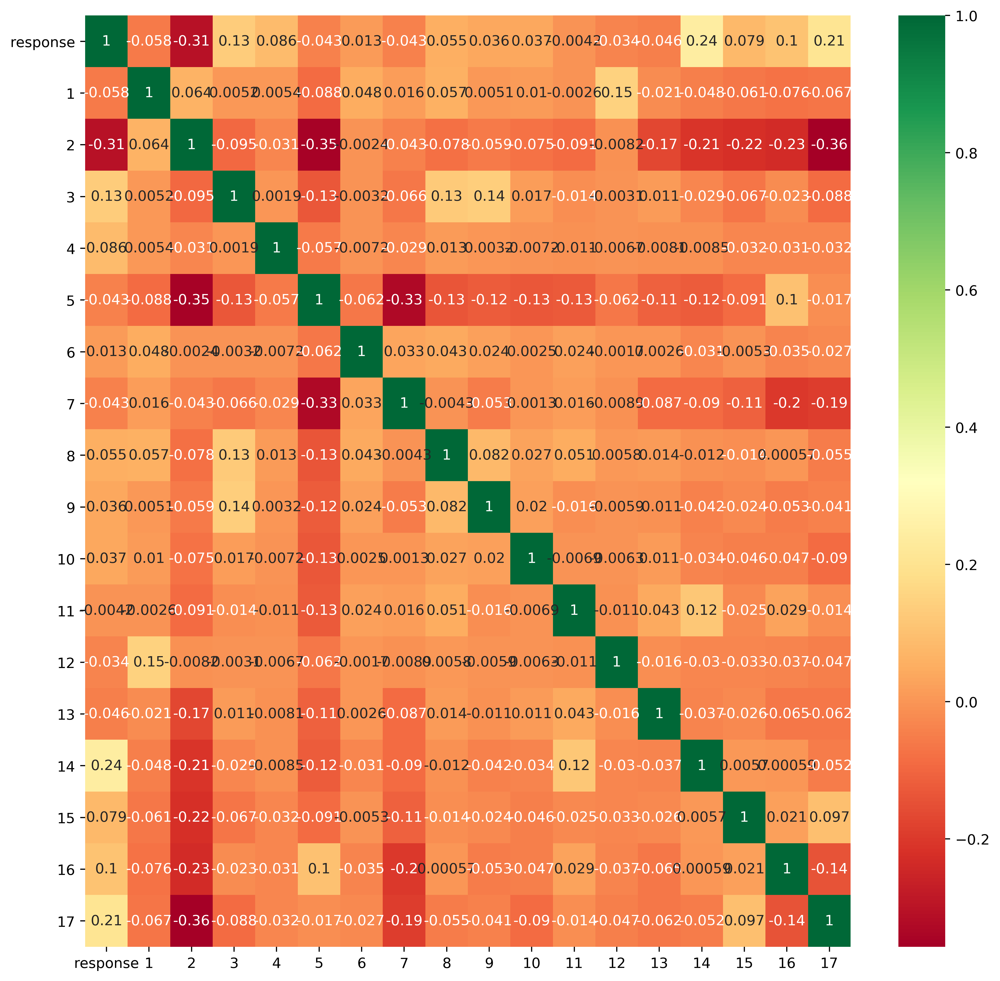

In [23]:
# taks normalized_usage_matrix and change id of df
usage_matrix = normalized_usage_matrix.copy()
usage_matrix['sample'] = [uu.split('_')[0] for uu in list(usage_matrix.index)]
usage_matrix['barcode'] = [uu.split('_')[1] for uu in list(usage_matrix.index)]
usage_matrix = usage_matrix.set_index(['sample', 'barcode']).reset_index()

# Loads xlsx files
CLINICAL_LABELS_PATH = r'/storage/md_keren/shitay/Data/tables/clinical_labels.xlsx'
MELANOMA_CLINICAL_DATA_PATH = r'/storage/md_keren/shitay/Data/tables/edited_unprotected_Melanoma_clinical_data.xlsx'
melanoma_clinical_data = pd.read_excel(MELANOMA_CLINICAL_DATA_PATH)
clinical_labels = pd.read_excel(CLINICAL_LABELS_PATH)

# takes nly first 46 samples, fill Nan and creat dictionary mapping
melanoma_clinical_data = melanoma_clinical_data.iloc[:46,:][['Patient id', 'Clinical response']]
melanoma_clinical_data['Clinical response'] = melanoma_clinical_data['Clinical response'].fillna('??')
labels_mapping = {v[0]: v[1] for v in clinical_labels[['Clinical response', 'binary label']].values}

# adds CRITERIA response into clinical df
melanoma_clinical_data['response'] = melanoma_clinical_data['Clinical response'].apply(lambda x: labels_mapping[x])

# merge clinical df with programs df to get response
usage_matrix_with_labels = pd.merge(usage_matrix, melanoma_clinical_data, how='left', left_on='sample', right_on='Patient id')

# remove samples that don't have response value yet
usage_matrix_with_labels = usage_matrix_with_labels[usage_matrix_with_labels['response'] != 'not in use for now']

# change response str values to int
usage_matrix_with_labels['response'] = usage_matrix_with_labels['response'].apply(lambda x: 0 if x=='NR' else 1)

# Print the number of response cells vs. number of non-response cells
# print(df_with_labels.groupby('response').count().reset_index().iloc[:,:2])

# Before calculating correlation, drop all unnecessary columns
programs_and_labels = usage_matrix_with_labels.drop(['sample', 'barcode', 'Patient id', 'Clinical response'],axis=1)

# change order of columns to have 'response' as the first one
programs_and_labels = programs_and_labels[programs_and_labels.columns.tolist()[-1:] + programs_and_labels.columns.tolist()[:-1]]

# calculates correlation
correlations = programs_and_labels.corr()

#plot heat map
plt.figure(figsize=(12,12))
g=sns.heatmap(correlations,annot=True,cmap="RdYlGn")

In [24]:
# g.get_figure().savefig(fr'/storage/md_keren/shitay/outputs/cNMF/visualizations/k{selected_K}/GEP_correlations.jpg')

#  ML 

In [51]:
# usage_matrix_with_labels #.drop(['sample', 'barcode', 'Patient id', 'Clinical response', 'response'], axis=1)

In [123]:
def train_model_and_predict(model, p_train, n_iter):
    samples = usage_matrix_with_labels['sample'].unique().tolist()
    cells_accuracies = []
    cells_recall = []
    cells_precision = []
    
    patients_accuracies = []
    patients_recall = []
    patients_precision = []
    


    for i in range(n_iter):
    #     print()
    #     print(f'{i+1}/{n_iter}', end=' ')
        train_samples = random.sample(samples, int(np.floor(len(samples)*p_train)))
        test_samples = [sample for sample in samples if not sample in train_samples]

    #     print('test')
    #     display(melanoma_clinical_data[melanoma_clinical_data['Patient id'].apply(lambda x: x in test_samples)]['response'].value_counts())
    #     print('train')
    #     display(melanoma_clinical_data[melanoma_clinical_data['Patient id'].apply(lambda x: x in train_samples)]['response'].value_counts())

        # First, define which variables are the features and which are the labels
        usage_matrix_with_labels
        train_df = usage_matrix_with_labels[usage_matrix_with_labels['Patient id'].apply(lambda x: x in train_samples)]
        X_train = train_df.drop(['sample', 'barcode', 'Patient id', 'Clinical response', 'response'], axis=1).values
        Y_train = train_df['response'].values

        test_df = usage_matrix_with_labels[usage_matrix_with_labels['Patient id'].apply(lambda x: x in test_samples)]
        X_test = test_df.drop(['sample', 'barcode', 'Patient id', 'Clinical response', 'response'], axis=1).values
        Y_test = test_df['response'].values
    
        # finally, train a classifier 
        
        model.fit(X_train, Y_train)


        # check our predictions!
        predictions = model.predict(X_test)
    #     print("classifier predictions for test set: \n", predictions)
    #     print("true labels for test set: \n", Y_test)
    #     print("The classifier's accuracy is:", np.count_nonzero(predictions == Y_test)/len(Y_test))
        cells_accuracies.append(accuracy_score(Y_test, predictions))
        cells_recall.append(recall_score(Y_test, predictions))
        cells_precision.append(precision_score(Y_test, predictions))

        predictions
        df = test_df.copy()[['sample', 'response']]
        df['pred'] = predictions
        df = df.groupby('sample').mean().reset_index()
        df['pred patient'] = np.round(df['pred'])
    #     print(f'acurracy patient:\t\t{sum(df["response"] == df["pred patient"]) / len(df)}')
#         patients_accuracies.append(sum(df["response"] == df["pred patient"]) / len(df))
        patients_accuracies.append(accuracy_score(df["response"].tolist(), df["pred patient"].tolist()))
        patients_recall.append(recall_score(df["response"].tolist(), df["pred patient"].tolist()))
        patients_precision.append(precision_score(df["response"].tolist(), df["pred patient"].tolist()))
        
    return cells_accuracies, cells_recall, cells_precision, patients_accuracies, patients_recall, patients_precision

Working on KNN
Working on RF
Working on SVM


Text(0.5, 1.0, 'Predicting response via program vectors, 25 iterations each model')

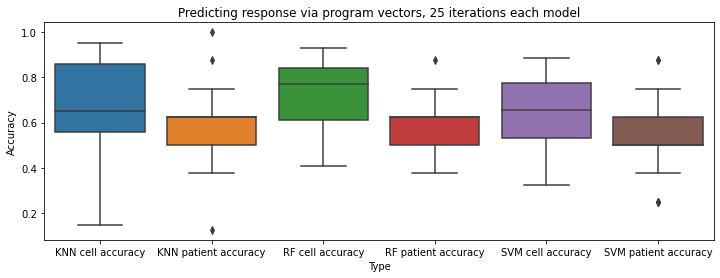

In [85]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm

# KNN with n=20
n_neighbors = 20
n_iter = 25


knn_classifier = KNeighborsClassifier(n_neighbors=n_neighbors)  # n_neighbors is the number of neighbors to use for classification
print('Working on KNN')
cells_accuracies, patients_accuracies = train_model_and_predict(knn_classifier, p_train, n_iter)

accuracy_df = pd.DataFrame(transpose([cells_accuracies, ['KNN cell accuracy']*n_iter]), columns=['Accuracy', 'Type'])
accuracy_df = accuracy_df.append(pd.DataFrame(transpose([patients_accuracies, ['KNN patient accuracy']*n_iter]), columns=['Accuracy', 'Type']))

# Random forest with dph 6
rf_classifier = RandomForestClassifier(max_depth=6, random_state=0)
print('Working on RF')
cells_accuracies, patients_accuracies = train_model_and_predict(rf_classifier, p_train, n_iter)

accuracy_df = accuracy_df.append(pd.DataFrame(transpose([cells_accuracies, ['RF cell accuracy']*n_iter]), columns=['Accuracy', 'Type']))
accuracy_df = accuracy_df.append(pd.DataFrame(transpose([patients_accuracies, ['RF patient accuracy']*n_iter]), columns=['Accuracy', 'Type']))

# SVM
svm = svm.SVC()
print('Working on SVM')
cells_accuracies, patients_accuracies = train_model_and_predict(svm, p_train, n_iter)
accuracy_df = accuracy_df.append(pd.DataFrame(transpose([cells_accuracies, ['SVM cell accuracy']*n_iter]), columns=['Accuracy', 'Type']))
accuracy_df = accuracy_df.append(pd.DataFrame(transpose([patients_accuracies, ['SVM patient accuracy']*n_iter]), columns=['Accuracy', 'Type']))

accuracy_df['Accuracy'] = accuracy_df['Accuracy'].astype(np.float)
# sns.set(font_scale=0.2)  # crazy big
# plt.rc_file_defaults()
# sns.reset_orig()
g = sns.boxplot(x="Type", y="Accuracy", data=accuracy_df);
# g = sns.boxplot(run1, orient="v");
g.figure.set_figwidth(12)
# g.figure.set_figheight(2)
g.set_title(f'Predicting response via program vectors, {n_iter} iterations each model')

Working on KNN


/Local/md_keren/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Local/md_keren/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Local/md_keren/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Local/md_keren/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification

Working on RF


/Local/md_keren/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Local/md_keren/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Local/md_keren/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Local/md_keren/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification

Working on SVM


/Local/md_keren/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Local/md_keren/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


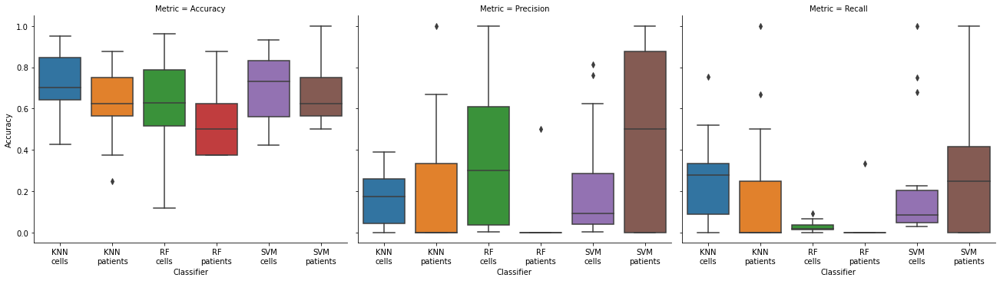

In [151]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm

# KNN with n=20
n_neighbors = 20
n_iter = 15


knn_classifier = KNeighborsClassifier(n_neighbors=n_neighbors)  # n_neighbors is the number of neighbors to use for classification
print('Working on KNN')
cells_accuracies, cells_recall, cells_precision, patients_accuracies, patients_recall, patients_precision = train_model_and_predict(knn_classifier, p_train, n_iter)

# add accuracy
df = pd.DataFrame(transpose([cells_accuracies, ['KNN\ncells']*n_iter, ['Accuracy']*n_iter]), columns=['Accuracy', 'Classifier', 'Metric'])
df = df.append(pd.DataFrame(transpose([patients_accuracies, ['KNN\npatients']*n_iter, ['Accuracy']*n_iter]), columns=['Accuracy', 'Classifier', 'Metric']))
# add precision
df = df.append(pd.DataFrame(transpose([cells_precision, ['KNN\ncells']*n_iter, ['Precision']*n_iter]), columns=['Accuracy', 'Classifier', 'Metric']))
df = df.append(pd.DataFrame(transpose([patients_precision, ['KNN\npatients']*n_iter, ['Precision']*n_iter]), columns=['Accuracy', 'Classifier', 'Metric']))
# add recall 
df = df.append(pd.DataFrame(transpose([cells_recall, ['KNN\ncells']*n_iter, ['Recall']*n_iter]), columns=['Accuracy', 'Classifier', 'Metric']))
df = df.append(pd.DataFrame(transpose([patients_recall, ['KNN\npatients']*n_iter, ['Recall']*n_iter]), columns=['Accuracy', 'Classifier', 'Metric']))




# Random forest with dph 6
rf_classifier = RandomForestClassifier(max_depth=6, random_state=0)
print('Working on RF')
cells_accuracies, cells_recall, cells_precision, patients_accuracies, patients_recall, patients_precision = train_model_and_predict(rf_classifier, p_train, n_iter)

# add accuracy
df = df.append(pd.DataFrame(transpose([cells_accuracies, ['RF\ncells']*n_iter, ['Accuracy']*n_iter]), columns=['Accuracy', 'Classifier', 'Metric']))
df = df.append(pd.DataFrame(transpose([patients_accuracies, ['RF\npatients']*n_iter, ['Accuracy']*n_iter]), columns=['Accuracy', 'Classifier', 'Metric']))
# add precision
df = df.append(pd.DataFrame(transpose([cells_precision, ['RF\ncells']*n_iter, ['Precision']*n_iter]), columns=['Accuracy', 'Classifier', 'Metric']))
df = df.append(pd.DataFrame(transpose([patients_precision, ['RF\npatients']*n_iter, ['Precision']*n_iter]), columns=['Accuracy', 'Classifier', 'Metric']))
# add recall 
df = df.append(pd.DataFrame(transpose([cells_recall, ['RF\ncells']*n_iter, ['Recall']*n_iter]), columns=['Accuracy', 'Classifier', 'Metric']))
df = df.append(pd.DataFrame(transpose([patients_recall, ['RF\npatients']*n_iter, ['Recall']*n_iter]), columns=['Accuracy', 'Classifier', 'Metric']))



# SVM
svm = svm.SVC()
print('Working on SVM')
cells_accuracies, cells_recall, cells_precision, patients_accuracies, patients_recall, patients_precision = train_model_and_predict(svm, p_train, n_iter)

#add accuracy
df = df.append(pd.DataFrame(transpose([cells_accuracies, ['SVM\ncells']*n_iter, ['Accuracy']*n_iter]), columns=['Accuracy', 'Classifier', 'Metric']))
df = df.append(pd.DataFrame(transpose([patients_accuracies, ['SVM\npatients']*n_iter, ['Accuracy']*n_iter]), columns=['Accuracy', 'Classifier', 'Metric']))
#add precision
df = df.append(pd.DataFrame(transpose([cells_precision, ['SVM\ncells']*n_iter, ['Precision']*n_iter]), columns=['Accuracy', 'Classifier', 'Metric']))
df = df.append(pd.DataFrame(transpose([patients_precision, ['SVM\npatients']*n_iter, ['Precision']*n_iter]), columns=['Accuracy', 'Classifier', 'Metric']))
# add recall 
df = df.append(pd.DataFrame(transpose([cells_recall, ['SVM\ncells']*n_iter, ['Recall']*n_iter]), columns=['Accuracy', 'Classifier', 'Metric']))
df = df.append(pd.DataFrame(transpose([patients_recall, ['SVM\npatients']*n_iter, ['Recall']*n_iter]), columns=['Accuracy', 'Classifier', 'Metric']))


df['Accuracy'] = df['Accuracy'].astype(np.float)
# sns.set(font_scale=0.2)  # crazy big
# plt.rc_file_defaults()
# sns.reset_orig()
# g = sns.boxplot(x="Type", y="Accuracy", data=df);
g = sns.catplot(x="Classifier", y="Accuracy", col="Metric", data=df, kind="box",height=5, aspect=1.2);
# g = sns.boxplot(run1, orient="v");
# g.figure.set_figwidth(12)
# g.figure.set_figheight(2)
# g.set_title(f'Predicting response via program vectors, {n_iter} iterations each model')
# g.fig.suptitle(f'Predicting response via program vectors, {n_iter} iterations each model')

# 2.1.22 - show programs active in sub-cohort

if you work with sub-cohort, taken from clinical table and you want to filter programs that are inactive for the subcohort

Loads the clinical table of the sub-cohort

In [3]:
CLINICAL_TABLE_NUM = 3
melanoma_clinical_data = get_constant_cohort(CLINICAL_TABLE_NUM) #get_clinical_data(71)#ICI=True, after_biopsy='ICI')
res_melanoma_clinical_data = melanoma_clinical_data.set_index('Patient id')
print(f'Num of samples in table is {len(melanoma_clinical_data)}')
# display(melanoma_clinical_data.head(20))
# res_melanoma_clinical_data['response'].value_counts()


Using clinical table in path:
 /storage/md_keren/shitay/Data/tables/Melanoma_clinical_data_12.21_unportected.csv

and labels:
/storage/md_keren/shitay/Data/tables/clinical_labels.csv
Num of samples in table is 18


Loads the GEP files:

In [4]:
EXEC_DIR = r'/storage/md_keren/shitay/outputs/cNMF/executions/tumor_runs/cohort_4.11.21'
selected_K = 30
local_density_threshold = '0.10'
number_of_genes=2000
n_replicates = 200
RUN_RANGE = '30'
N_PROG = 30
RUN_NAME = f'k{RUN_RANGE}_{number_of_genes}genes_{n_replicates}iter'
USAGES_CONSENSUS_FILE = f'{RUN_NAME}.usages.k_{selected_K}.dt_{str(local_density_threshold).replace(".", "_")}.consensus.txt'

usage_matrix = pd.read_csv(join(EXEC_DIR, RUN_NAME, USAGES_CONSENSUS_FILE), sep='\t', index_col=0)
usage_matrix.columns = np.arange(1,selected_K+1)
normalized_usage_matrix = usage_matrix.div(usage_matrix.sum(axis=1), axis=0)
# normalized_usage_matrix.head()


################
samples = list(set([uu.split('_')[0] for uu in list(normalized_usage_matrix.index)]))
df = normalized_usage_matrix.copy()
df['sample'] = [uu.split('_')[0] for uu in list(df.index)]
df['barcode'] = [uu.split('_')[1] for uu in list(df.index)]
# keep only data of current patients in cohort
GEP_all_samples_df = df.copy()
df = df[df['sample'].isin(res_melanoma_clinical_data.index.tolist())]



### set a minimun usage threshold for a cells and then see the fraction of cells in each sample that the usage > threshold

In [5]:
cell_usage_threshold = 0.1


GEP_df = df.copy().drop(columns=['barcode'])#.set_index(['sample', 'barcode'])
GEP_df.iloc[:,:30] = GEP_df.iloc[:,:30] > cell_usage_threshold
fraction_GEP_df = (GEP_df.groupby('sample').sum() / GEP_df.groupby('sample').count()).reset_index()
fraction_GEP_df = fraction_GEP_df.melt( value_name="usage",  var_name="program", id_vars=['sample'])

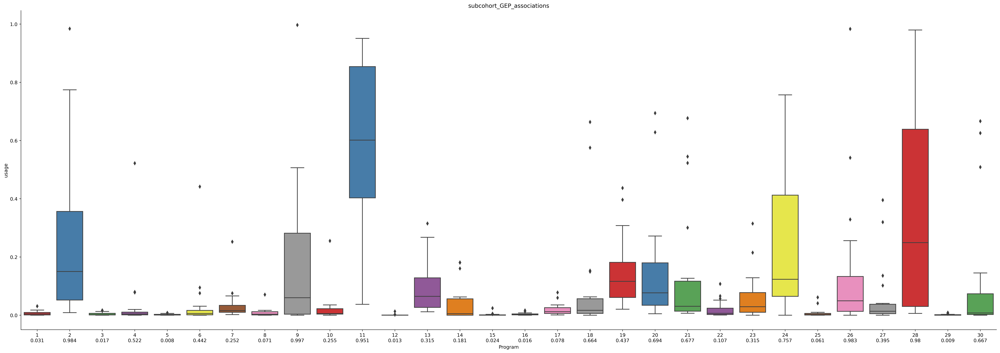

In [6]:
max_fractions = fraction_GEP_df.groupby('program').max()['usage'].to_frame()
fraction_GEP_df['Program'] = fraction_GEP_df['program'].apply(lambda x: f'{x}\n{max_fractions.loc[x][0].round(3)}')

ax = sns.catplot(kind="box", x='Program', y='usage', data=fraction_GEP_df, palette="Set1",height=10, aspect=2.9).set(title="subcohort_GEP_associations")
# sns.stripplot(x='Program', y='fraction', hue='response', data=activity_fraction_df,
#               jitter=True, dodge=True, linewidth=0.5, palette={'NR':'r', 'R':'b'});
ax.savefig(r'/storage/md_keren/shitay/garbage/subcohort_GEP_associations')

### take the sample with the highest fraction and see if the fraction is above the threshold, if so, the program is active

In [32]:
threshold_max_sample_min_fraction_of_cells = 0.05

highest_sample_fraction = fraction_GEP_df.groupby('program').max()['usage'].to_frame()


active_program_idxs = highest_sample_fraction[highest_sample_fraction.usage > threshold_max_sample_min_fraction_of_cells].reset_index()['program'].values.tolist()
print(f'Active programs idxs: {active_program_idxs}')

Active programs idxs: [2, 4, 6, 7, 8, 9, 10, 11, 13, 14, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 30]


### see in percentage/numbers hoe many cells associated with programs

In [93]:
count_cells_in_prog = GEP_df.iloc[:,:30].sum()

Total number of cells: 51401


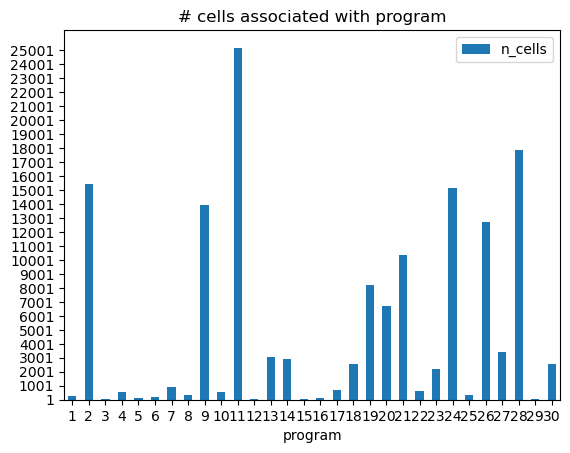

In [134]:
plt.rcdefaults()  # reset params
n_cells_df = count_cells_in_prog.to_frame().reset_index().rename(columns={'index':'program', 0:'n_cells'})
n_cells_df['% cells'] = n_cells_df.n_cells/GEP_df.shape[0]
n_cells_df.plot.bar(x='program', y='n_cells', yticks=range(1,26000, 1000), rot=0, title='# cells associated with program')
print(f'Total number of cells: {GEP_df.shape[0]}')

<AxesSubplot:title={'center':'% cells associated with program'}, xlabel='program'>

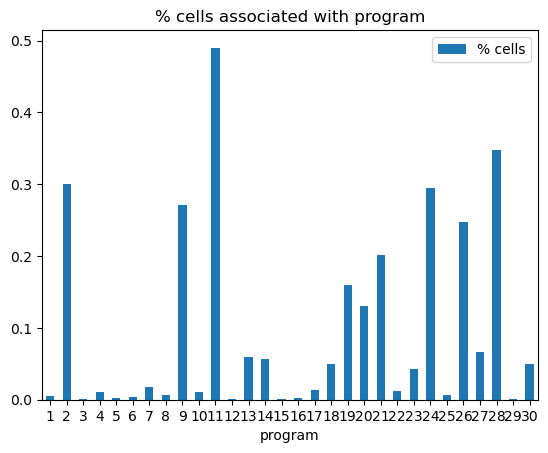

In [135]:
n_cells_df.plot.bar(x='program', y='% cells', rot=0, title='% cells associated with program')

# Print top genes of specified program

In [ ]:
topgenes = []
num_top_genes=50
for gep in gene_scores.columns:
    topgenes.append(pd.Series(gene_scores[gep].sort_values(ascending=False).index[:num_top_genes]))
    
topgenes = pd.concat(topgenes, axis=1)
topgenes.columns = ['GEP%d' % g for g in gene_scores.columns]

# topgenes

In [ ]:
# for g in topgenes["GEP19"].values.tolist():
#     print(g)

# DEBUG

In [1]:
# programs_vals = tsne_and_usages[2].values
# dict(Counter(np.round(programs_vals, 1)))

In [1]:
# for (columnName, columnData) in normalized_usage_matrix.iteritems():
#     print('Program : ', columnName)
#     programs_vals = columnData.values
#     counter_programs_values = sort_dic(dict(Counter(np.round(programs_vals, 1))), ascending=False)
#     print(counter_programs_values)
#     dd = list(counter_programs_values.values())
#     print([(i/10, round(sum(dd[i:]), 2)) for i in range(11)])
#     print()

In [ ]:
# print(counter_programs_values)

# # dd = list(counter_programs_values.values())
# # [(i/10, round(sum(dd[i:]), 2)) for i in range(11)]
# import seaborn as sns
# from utilities.general_helpers import sort_dic

# k = 18
# sns.distplot(np.round(tsne_and_usages[k].values, 1), hist=False)
# # list(np.round(programs_vals, 1))
# Counter(np.round(tsne_and_usages[k].values, 1))

In [ ]:
# tsne_and_usages.head()

In [ ]:
# programs_1 = tsne_and_usages[tsne_and_usages.columns[4]].values
# programs_1

In [ ]:
# len(list(tsne_and_usages.index))

In [ ]:
# def some_func(x):
#     return round(x*10)



# ttt = dict(Counter(tsne_and_usages[tsne_and_usages.columns[4]].apply(some_func).values))

# # fig, ax = plt.pyplot.subplots()    
# # ax.bar(list(ttt.keys()), list(ttt.values()))
# # for i, v in enumerate(list(ttt.values())):
# #     ax.text(v + 3, i + .25, str(v), color='blue', fontweight='bold')

# print({k: v for k, v in sorted(ttt.items(), key=lambda item: item[0])})
# sum([vv for k, vv in ttt.items() if k>0])

In [ ]:
# barcodes = np.array(tsne_and_usages.index.tolist())

In [ ]:
# order = np.flip(np.argsort(programs_1))
# barcodes[order][:10]
# # programs_1[order][:10]


# DEBUG

In [37]:
# overdis_genes = [line.replace('\n', '') for line in lines]
# overdis_genes[-10:]
# path2 = r'/storage/md_keren/shitay/Data/tables/gene_ens_map.xlsx'
# ex = pd.read_excel(path2)
# ex_genes = ex[ex['long_noncoding']=='protein_coding']['MIR1302-11'].values.tolist()
[g for g in overdis_genes if not g in ex_genes]

['TMEM236.1', 'PSMA2.1']

In [34]:
path = r'/storage/md_keren/shitay/outputs/cNMF/executions/tumor_runs/cohort_26.6.21/k5_14_2000genes_10iter/k5_14_2000genes_10iter.overdispersed_genes.txt'

with open(path) as f:
    lines = f.readlines()

In [7]:
overdis_genes = [line.replace('\n', '') for line in lines]
overdis_genes[-10:]

['RP11-290D2.6',
 'CTA-384D8.34',
 'RP11-386I14.4',
 'RP5-899E9.1',
 'RP11-268E23.2',
 'RP11-480C22.1',
 'RP4-539M6.22',
 'RP11-1399P15.1',
 'RP11-108L7.14',
 'RP11-80H18.4']

In [11]:
path2 = r'/storage/md_keren/shitay/Data/tables/gene_ens_map.xlsx'
ex = pd.read_excel(path2)

In [21]:
ex_genes = ex[ex['long_noncoding']=='protein_coding']['MIR1302-11'].values.tolist()

In [24]:
len(overdis_genes)
len(ex_genes)

20776

In [26]:
len([g for g in overdis_genes if g in ex_genes])

1423

In [31]:
[g1.split('.')[0] for g1 in overdis_genes]

['FGR',
 'CFH',
 'CFTR',
 'TFPI',
 'CD38',
 'PDK4',
 'SLC4A1',
 'ITGAL',
 'ASB4',
 'CCL18',
 'CCL3',
 'LGALS14',
 'SELE',
 'IL32',
 'MASP2',
 'TRAF3IP3',
 'CD9',
 'HHATL',
 'SEMA3G',
 'STAB1',
 'SLC6A7',
 'DCN',
 'TYROBP',
 'ALOX5',
 'CLDN11',
 'CD6',
 'WAS',
 'STMN4',
 'IGF1',
 'SLC11A1',
 'MARCO',
 'CD74',
 'C8B',
 'BIRC3',
 'VIM',
 'IBSP',
 'TMSB10',
 'MYOC',
 'STAP1',
 'FLT4',
 'VCAN',
 'MSR1',
 'TNC',
 'C2orf83',
 'CAPG',
 'ADAM28',
 'TNFRSF17',
 'UTS2',
 'TNFRSF9',
 'ELN',
 'TNIP3',
 'ITIH1',
 'SERPINB3',
 'SLC2A3',
 'GNA15',
 'VMP1',
 'WISP2',
 'NGFR',
 'BCAS1',
 'CALCRL',
 'SLC9A3R2',
 'COL17A1',
 'CD84',
 'SPI1',
 'FGFR2',
 'ACSM2B',
 'KLF6',
 'PKM',
 'GPR116',
 'SCT',
 'DAPP1',
 'PABPC1',
 'EPHA8',
 'SPP2',
 'TRPC5',
 'DHRS9',
 'CD5L',
 'PTGS2',
 'TBX21',
 'NOTCH3',
 'IPCEF1',
 'ENO1',
 'ACTB',
 'ATP12A',
 'ARHGAP15',
 'NMRK2',
 'APBB1IP',
 'FBLN1',
 'CST7',
 'EDN1',
 'P2RY10',
 'SP140',
 'DCT',
 'COL5A3',
 'CLDND1',
 'CFHR2',
 'CXCL2',
 'LRP2',
 'OPRK1',
 'EPYC',
 'GSTP1',
 

In [ ]:
# gene_indices = np.flip(np.argsort(tumor_cohort.counts[tumor_cohort.barcodes.index('CTACCCAAGATGCCTT-1')]))

# tumor_cohort.gene_names[gene_indices[6]]

In [ ]:

# # tumor_cohort.gene_names.index('CD3E')
# tumor_cohort.number_of_genes

In [ ]:
# tumor_path = r'/storage/md_keren/shitay/Data/droplet_seq/cohort/normalized/tumor_cells.pkl'
# tumor_cohort = pickle.load(open(tumor_path, 'rb'))

In [ ]:
# idx = tumor_cohort.gene_names.index('CD3E')

# tumor_cohort.counts[tumor_cohort.barcodes.index('GCTGCAGGTACAGTTC-1')][idx]

In [ ]:
# tumor_cohort.samples[tumor_cohort.barcodes.index('GCTGCAGGTACAGTTC-1')]

In [ ]:
# gene_idx = tumor_cohort.gene_names.index('FOXP3')
# cell_idx = tumor_cohort.barcodes.index('GGCGTGTTCAGGATCT-1')
# tumor_cohort.counts[cell_idx][gene_idx]
# tumor_cohort.cells_information[cell_idx].cancer_immune_conflict

In [ ]:
# sum(tumor_cohort.cells_information.getattr('is_doublet'))

In [ ]:
# sum(tumor_cohort.cells_information.getattr('should_be_removed'))

In [ ]:
# cohort_path = r'/storage/md_keren/shitay/Data/droplet_seq/cohort/normalized/cohort.pkl'
# cohort = pickle.load(open(tumor_path, 'rb'))

In [ ]:
# is_doublet = cohort.cells_information.getattr('is_doublet')
# cohort.samples
# sum(is_doublet)

# Counter([cohort.samples[ii] for ii in range(len(cohort.samples)) if is_doublet[ii]])

In [81]:
prog_genes = ['MT-CYB', 'MT-ND5', 'MT-CO3', 'MT-ND4', 'MT-ATP6', 'MT-ND2', 'MT-ND1', 'RPL39', 'MT-CO2', 'MT-ND3', 'RPS14', 'FCGR2A', 'MT-ATP8', 'FXYD3', 'RPL15', 'RPL23A', 'SIGLEC15', 'MT-CO1', 'TPT1', 'RPS4Y1', 'MT-ND4L', 'RPS23', 'CHL1', 'RPL32', 'SPRY4', 'TOMM7', 'RPL14', 'CHCHD6', 'RPL37', 'RPL35A', 'FASN', 'PSCA', 'HPN-AS1', 'ALDH1A3', 'ERBB3', 'RP11-542A14.1', 'ATP1B1', 'AEBP1', 'RPL34', 'RPL4', 'RPLP1', 'RPL22', 'SFRP1', 'ANKS1A', 'TMEM163', 'RPL37A', 'RPL10A', 'DNASE2B', 'F2RL2', 'NSA2', 'RPSA', 'RPS8', 'TYR', 'UGCG', 'CYTH3', 'TEKT5', 'RPS21', 'GJB1', 'APCDD1', 'RPL11', 'SLAMF1', 'PEG10', 'RPL13A', 'RPL10', 'GRIA1', 'SNCA', 'EDNRB', 'IQGAP2', 'RPL36A', 'LPPR4', 'PTTG1IP', 'PYCARD', 'TCERG1L', 'SEMA5A', 'RPS16', 'ETV5', 'PLEKHB1', 'RPL24', 'RPL9', 'LINC00890', 'PDE3B', 'RPS3', 'RPL29', 'MCOLN3', 'SHISA2', 'RP11-542A14.2', 'LINC01088']


In [2]:
#### For Liron - extract information of K=27

In [ ]:
####

In [16]:
######### print all top genes of all K's for liron:

for K in range(5,41):
    GENE_SPECTRA_SCORE_PATH = f'/storage/md_keren/shitay/liron_project/outputs/cNMF/executions/smartseq/tumor_runs/cohort_8.8.21/k5_40_2000genes_10iter/k5_40_2000genes_10iter.gene_spectra_score.k_{K}.dt_0_10.txt'
    gene_scores = pd.read_csv(GENE_SPECTRA_SCORE_PATH, sep='\t', index_col=0)
    gene_scores = gene_scores.T
    # gene_scores.head()

    topgenes = []
    num_top_genes=100
    for gep in gene_scores.columns:
        topgenes.append(pd.Series(gene_scores[gep].sort_values(ascending=False).index[:num_top_genes]))

    topgenes = pd.concat(topgenes, axis=1)
    topgenes.columns = ['GEP%d' % g for g in gene_scores.columns]

    # topgenes.head(10)
    topgenes.to_excel(fr'/storage/md_keren/shitay/liron_project/outputs/cNMF/executions/smartseq/tumor_runs/cohort_8.8.21/Excels/top_genes/k{K}_GEP_top_100_genes.xlsx')

In [ ]:
### Print all usage matrices of all Ks:

EXEC_DIR = r'/storage/md_keren/shitay/liron_project/outputs/cNMF/executions/smartseq/tumor_runs/cohort_8.8.21'
local_density_threshold = '0.10'
number_of_genes=2000
n_replicates = 10
RUN_RANGE = '5_40'

for K in range(5,41):
    RUN_NAME = f'k{RUN_RANGE}_{number_of_genes}genes_{n_replicates}iter'
    USAGES_CONSENSUS_FILE = f'{RUN_NAME}.usages.k_{K}.dt_{str(local_density_threshold).replace(".", "_")}.consensus.txt'


    usage_matrix = pd.read_csv(join(EXEC_DIR, RUN_NAME, USAGES_CONSENSUS_FILE), sep='\t', index_col=0)
    usage_matrix.columns = np.arange(1,K+1)
    normalized_usage_matrix = usage_matrix.div(usage_matrix.sum(axis=1), axis=0)
    normalized_usage_matrix.head()

    normalized_usage_matrix.to_excel(fr'/storage/md_keren/shitay/liron_project/outputs/cNMF/executions/smartseq/tumor_runs/cohort_8.8.21/Excels/usages/k{K}_normalized_usages.xlsx')